## **Home Work 1: Linear Analysis and Control**

### Ostapovich Oleg

### **Problem №1: Regulation of magnetic tape system**

Consider the magnetic tape system:
<p align="center">
    <img src="https://drive.google.com/uc?id=1zMpp0prjxG921cSIyi-Ea7LJMhmrexFf" alt="drawing" width="50%" style="margin:auto"/>
</p>

The behavior of this system is governed by following differential equations:
$$
\left\{\begin{matrix}
J_1\ddot{\theta}_1= - T_e r + K_m i_1
\\ 
J\ddot{\theta}_2= - T_e r + K_m i_2
\\ 
T_e = k(x_2-x_1) +b (\dot{x}_2 - \dot{x}_1)
\\
x_3 = \frac{x_1+x_2}{2}
\end{matrix}\right.
$$

where: 
* $\theta_1,\theta_2$, [rad] - angular position of motor capstan assembly
* $x_1,x_2$, [mm] - position of tape at capstan assembly
* $i_1,i_2$, [A] - current into drive motors 1 and 2
* $x_3$, [mm] - position of tape over read head
* $T_e$, [N] - tension in tape

and the system parameters are given as follows:

In [51]:
from matplotlib import pyplot as plt
from IPython.display import Image

J = 0.006375 # [kg m^2] - motor and capstan inertia
K_m = 0.544 # [Nm/A] - motor torque constant
k = 2113 # [N/m] - tape spring constant
b = 3.75 # [Ns/m] - tape damping constant
r = 0.05 # [m] - capstan radius

---

The goal is to design feedback controller, $\mathbf{u} = -\mathbf{K}\mathbf{x}$ to **regulate to constant position of magnetic tape $x_3 = x_d$** [mm] over the read head of a magnetic tape drive **while maintaining a specified tension $T_e = 10$**, namely:
* **[10 points]** Rewrite system in **linear state space form**:
  * note that position and motor angle are coupled with: $x_j = r\theta_j$
  * take control input as current: $u_j = i_j$
* **[20 points]** Test the **stability** and **controllability**:
  * Answer either this system stable and controllable
  * Check controllability just with one actuator $u = i_1$ ($i_2 = 0$) 
  * What is the minimal number of control channels for this sytem to be controllable/stabilizable 
* **[35 points]** **Place poles of closed loop system** (find feedback gains) such that tension $T_e$ and position $x_3$ - converges to desired values $x_d, T_d$, simulate the response in the [colab](https://colab.research.google.com/).

---


# Task 1

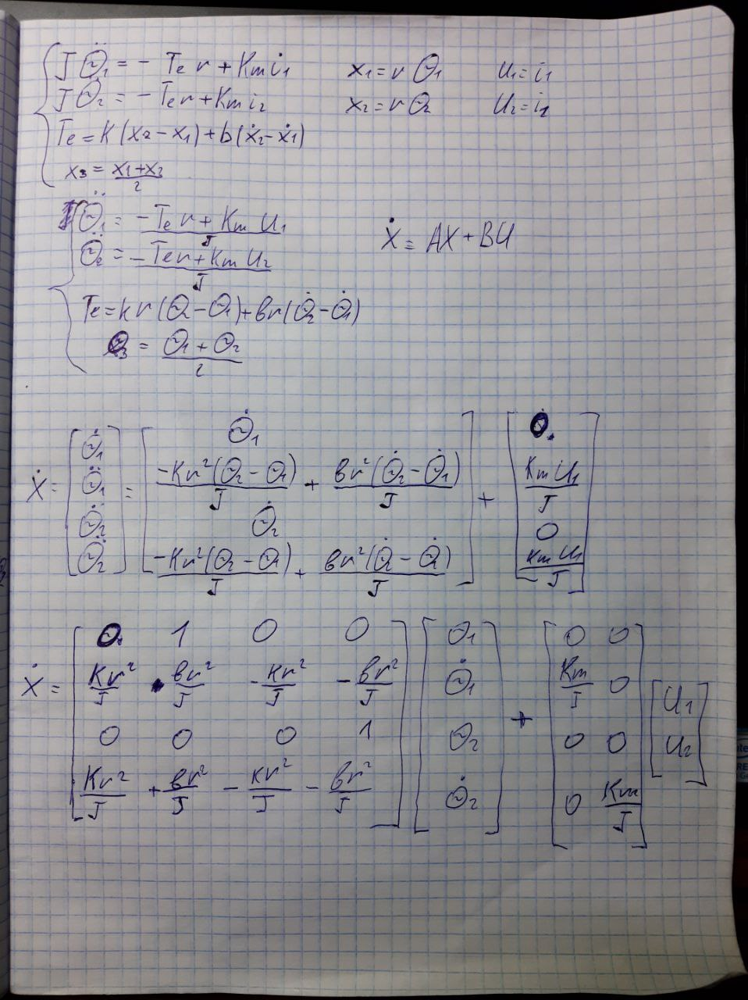

In [52]:
Image(filename='photo_2022-11-16_18-09-59.jpg')

In [53]:
import numpy as np
tempK = (k*r**2)/J
tempB = (b*r**2)/J
A = np.zeros((4,4))
A[0,1] = 1
A[1,0] = tempK
A[1,1] = tempB
A[1,2] = -tempK
A[1,3] = -tempB
A[2,3] = 1
A[3,:] = A[1,:]

B = np.zeros((4,2))
B[1,0] = K_m / J
B[3,1] = B[1,0]

In [54]:
A

array([[   0.        ,    1.        ,    0.        ,    0.        ],
       [ 828.62745098,    1.47058824, -828.62745098,   -1.47058824],
       [   0.        ,    0.        ,    0.        ,    1.        ],
       [ 828.62745098,    1.47058824, -828.62745098,   -1.47058824]])

# Task 2

In [55]:
# controllability with two actuators
n = B.shape[0]
m = B.shape[1]
C = B.copy()

for i in range(1, n):
    A_pwr_n = np.linalg.matrix_power(A, i)
    C = np.hstack((C, A_pwr_n.dot(B)))
    rank_C = np.linalg.matrix_rank(C)
if rank_C == n:
    print('controllable')
else:
    print('uncontrollable')

controllable


In [56]:
# controllability with one actuator
n = B.shape[0]
m = 1
C = B[:,1].copy()

for i in range(1, n):
    A_pwr_n = np.linalg.matrix_power(A, i)
    C = np.column_stack((C, A_pwr_n.dot(B[:,1])))
    rank_C = np.linalg.matrix_rank(C)
if rank_C == n:
    print('controllable')
else:
    print('uncontrollable')

controllable


In [57]:
lambdas, v = np.linalg.eig(A)
lambdas

array([-0.00269385+0.00269385j, -0.00269385-0.00269385j,
        0.00269385+0.00269386j,  0.00269385-0.00269386j])

Till all Eugen values are not lower than zero, system is not stable

So this system is controllable and not stable, it can be controlled even with one actuator, one actuator is minimal number of actuators to control system

# Task 3

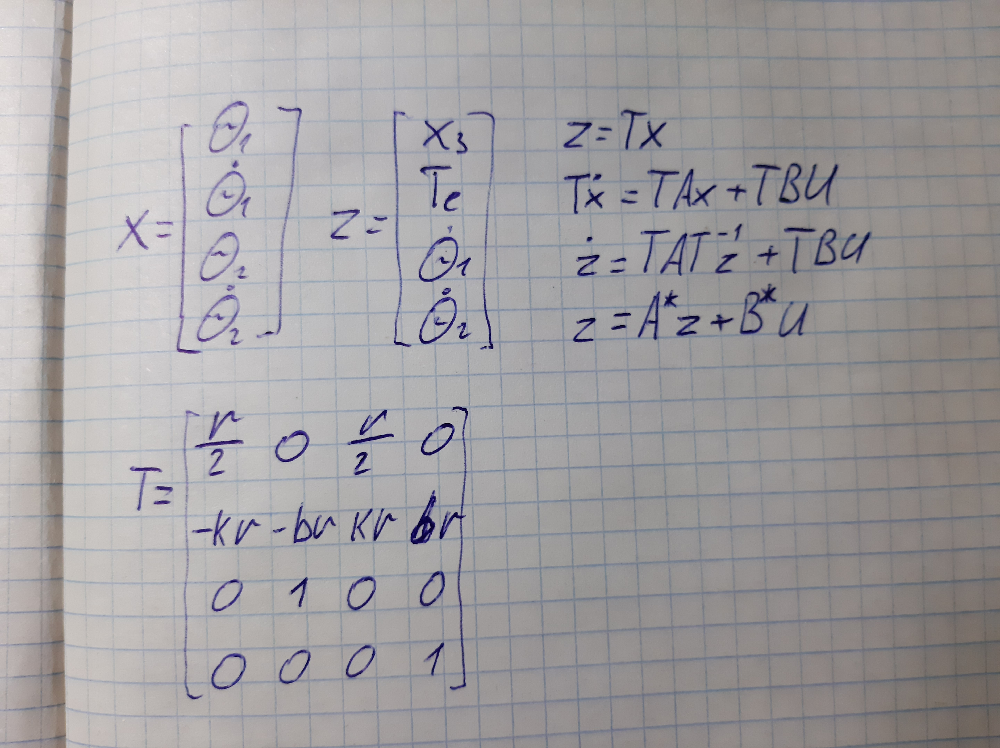

In [58]:
Image(filename='120221117_145118.jpg')

In [59]:
# transfer matrix
T = np.zeros((4,4))
T[0,0] = T[0,2] = 0.5 * r
T[1,0] = -k*r
T[1,1] = -b*r
T[1,2] = k*r
T[1,3] = b*r
T[2,1] = 1
T[3,3] = 1
T

array([[ 2.5000e-02,  0.0000e+00,  2.5000e-02,  0.0000e+00],
       [-1.0565e+02, -1.8750e-01,  1.0565e+02,  1.8750e-01],
       [ 0.0000e+00,  1.0000e+00,  0.0000e+00,  0.0000e+00],
       [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])

In [60]:
A_hat = T @ A @ np.linalg.inv(T)
B_hat = T @ B

Desired poles:
 [-4 -3 -2 -1], 
Designed poles:
 [-4.00000003 -3.         -2.00000001 -1.        ]


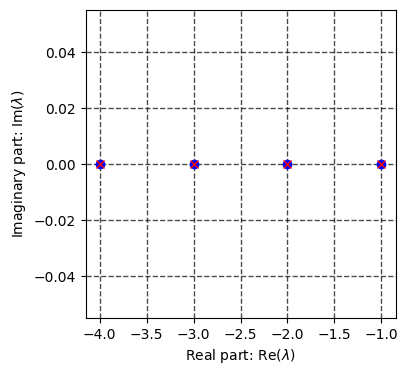

In [61]:
from scipy.signal import place_poles

poles = np.array([-4, -3, -2, -1])
K = place_poles(A_hat, B_hat, poles).gain_matrix
# Check the closed loop poles
Ac = A_hat - B_hat @ K
eigs = np.linalg.eigvals(Ac)
print(f'Desired poles:\n {poles}, \nDesigned poles:\n {np.sort(eigs)}')

# Get the plot of desired and designed poles
plt.figure(figsize=(4, 4))
plt.plot(poles.real, poles.imag, 'bo', label='Desired')
plt.plot(eigs.real, eigs.imag, 'rx',label='Actual')
plt.grid(color='black', linestyle='--', linewidth=1.0, alpha = 0.7)
plt.grid(True)
plt.xlabel(r'Real part: ${ \operatorname{Re}(\lambda)}$')
plt.ylabel(r'Imaginary part: ${ \operatorname{Im}(\lambda)}$')
plt.show()

In [62]:
# Time settings
t0 = 0 # Initial time
tf = 10 # Final time
N = int(2E3) # Numbers of points in time span
t = np.linspace(t0, tf, N) # Create time span

# Define initial point
x1 = 1
x2 = 10/k + x1
Te = 10
x3 = (x1+x2)/2

# Set initial state
x0 = [x3,
      Te,
      x1,
      x2]

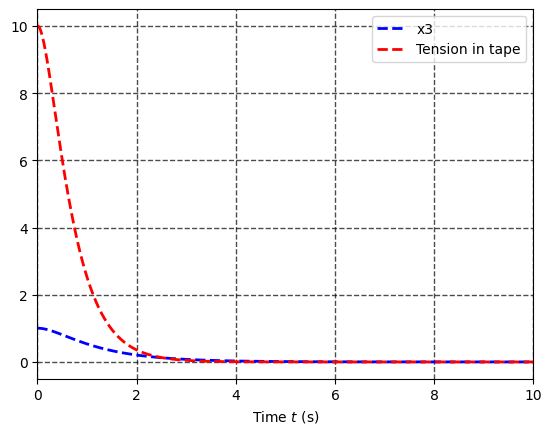

In [63]:
from scipy.integrate import odeint

def linear_closed(x, t, A, B, K):
    # Linear controller
    u = - np.dot(K,x)
    # Linearized dynamics
    dx = np.dot(A,x) + np.dot(B,u)
    return dx

# integrate system "sys_ode" from initial state $x0$
x_l = odeint(linear_closed, x0, t, args=(A_hat, B_hat, K))
x3d,Td,x1d,x2d = x_l[:,0], x_l[:,1], x_l[:,2], x_l[:,3]
# Plot the resulst
plt.plot(t, x3d, 'b--', linewidth=2.0, label = "x3")
plt.plot(t, Td, 'r--', linewidth=2.0, label = "Tension in tape")
plt.grid(color='black', linestyle='--', linewidth=1.0, alpha = 0.7)
plt.grid(True)
plt.legend()
plt.xlim([t0, tf])
plt.xlabel(r'Time $t$ (s)')
plt.show()


### **Problem №2: Pole Placement Design of Linear Observers**

The distinguishable properties of full state feedback controllers is that the measurements of system state should be measurable. However, in most practical cases, the physical state of the system cannot be determined by direct observation. Instead, **indirect effects of the internal state are estimated by way of the system outputs**. 
The algorithm (dynamical system) that supports such estimation is called the **state observer** (state estimator). More specifically we consider the LTI system in state space form:

$$
\begin{matrix}
    \dot{\mathbf{x}} = \mathbf{A}\mathbf{x} + \mathbf{B} \mathbf{u}\\
    \mathbf{y}=\mathbf{C}\mathbf{x}
\end{matrix}
$$

Where the last equation describe your actual measurements (output) as some linear combination of states $\mathbf{y} = \mathbf{C}\mathbf{x}$. Goal is to estimate the full state $\hat{\mathbf{x}}$, based on known measurements $\mathbf{y}$ and control signal $\mathbf{u}$ assuming that $\mathbf{A}, \mathbf{B}, \mathbf{C}$ are known. 

--- 

Consider the state observer algorithm is given as follows:
$$
\begin{matrix}
    \dot{\hat{\mathbf{x}}} = \mathbf{A}\hat{\mathbf{x}} + \mathbf{B} \mathbf{u} + \mathbf{L}(\mathbf{y} - \hat{\mathbf{y}})
\end{matrix}
$$

Do the following:
* **[15 Points]** Find the closed loop response of estimation error $\mathbf{e} = \hat{\mathbf{x}} - \mathbf{x}$ in terms of $\mathbf{A}, \mathbf{C}, \mathbf{L}, \mathbf{e}(t)$ (equations for $\dot{\mathbf{e}}$). 
* **[20 Points]**  What are the conditions on $\mathbf{L}$ that implies the convergence of estimates $\hat{\mathbf{x}}$ to the actual state $\mathbf{x}$, describe how would you use pole placement routine to tune observer gains $\mathbf{L}$
*  **[BONUS]** Implement the proposed observer in order to estimate the motor states $\theta_j, \dot{\theta}_j$ of magnetic tape system given the measurements of $x_3$ and $T_e$  and use these estimate for the feedback instead of $\mathbf{x}$, ($\mathbf{u} = -\mathbf{K}\hat{\mathbf{x}}$)

---






# Task 1

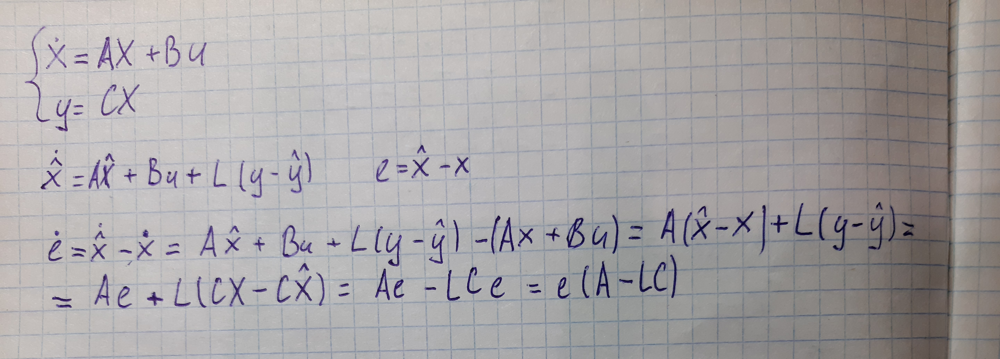

In [64]:
Image(filename='1220221116_215234.jpg')

# Task 2

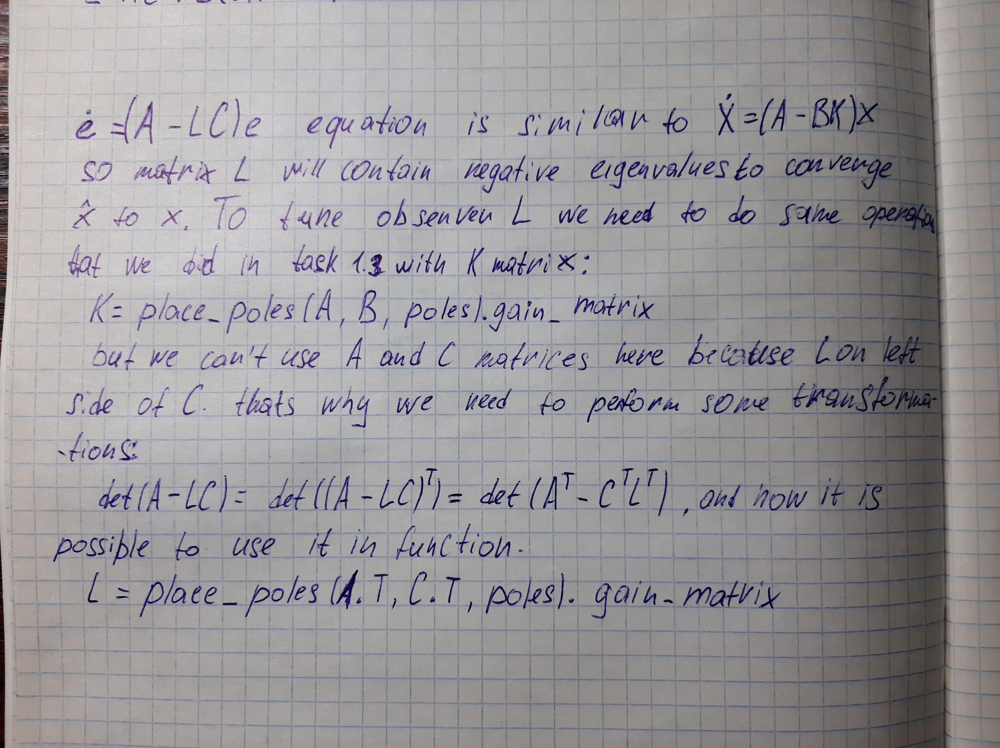

In [65]:
Image(filename='20221117_152626.jpg')